# Projeto #2 - Classificador supervisionado

Antes de começar, leia as [Instruções](https://github.com/thvmm/pos-ds-ia/tree/master/projeto_2#instru%C3%A7%C3%B5es) e os [Critérios de Avaliação](https://github.com/thvmm/pos-ds-ia/tree/master/projeto_2#crit%C3%A9rios-de-avalia%C3%A7%C3%A3o)


In [1]:
%matplotlib inline
#### Funcoes Uteis
import pandas as pd
import matplotlib as plt
from sklearn.metrics import confusion_matrix
import seaborn as sns; sns.set()

# PERCENTUAL DE ELEMENTOS NULOS
def missing_percentage(df):
    total = df.isnull().sum()
    percent = round(df.isnull().mean()*100,2)
    return pd.concat([total, percent], axis=1, keys=['Total','Percent'])

#Confusion Matrix - método de validação escolhido p/ target não-binário
def conf_matrix(ytest,ypred):
    mat = confusion_matrix(ytest, ypred)
    sns.heatmap(mat.T, square=True, annot=True, fmt='d', cbar=False)
    # plt.xlabel('true label')
    # plt.ylabel('predicted label');


### 1) Qual a base escolhida?

*Indique a base escolhida.*

A base escolhida foi Forest covertypes - https://archive.ics.uci.edu/ml/datasets/Covertype



In [2]:
## P/ Rodar do Google Colab

# from google.colab import drive
# drive.mount('/content/drive')
# cd 'My Drive/Academico/UniBH-AI and DataScience/Git/projetos/classificador_projeto_2'

In [3]:
# Implemente sua análise aqui. Use mais blocos se achar que ficará mais organizado.

# Leitura dos dados brutos para o dataframe e atribuicao do nome da feature
df = pd.read_csv('./data/covtype.data', names =['Elevation',
                'Aspect',
                'Slope',
                'Horizontal_Distance_To_Hydrology',
                'Vertical_Distance_To_Hydrology',
                'Horizontal_Distance_To_Roadways',
                'Hillshade_9am',
                'Hillshade_Noon',
                'Hillshade_3pm',
                'Horizontal_Distance_To_Fire_Points',
                'Wilderness_Area1',
                'Wilderness_Area2',
                'Wilderness_Area3',
                'Wilderness_Area4',
                'Soil_Type1',
                'Soil_Type2',
                'Soil_Type3',
                'Soil_Type4',
                'Soil_Type5',
                'Soil_Type6',
                'Soil_Type7',
                'Soil_Type8',
                'Soil_Type9',
                'Soil_Type10',
                'Soil_Type11',
                'Soil_Type12',
                'Soil_Type13',
                'Soil_Type14',
                'Soil_Type15',
                'Soil_Type16',
                'Soil_Type17',
                'Soil_Type18',
                'Soil_Type19',
                'Soil_Type20',
                'Soil_Type21',
                'Soil_Type22',
                'Soil_Type23',
                'Soil_Type24',
                'Soil_Type25',
                'Soil_Type26',
                'Soil_Type27',
                'Soil_Type28',
                'Soil_Type29',
                'Soil_Type30',
                'Soil_Type31',
                'Soil_Type32',
                'Soil_Type33',
                'Soil_Type34',
                'Soil_Type35',
                'Soil_Type36',
                'Soil_Type37',
                'Soil_Type38',
                'Soil_Type39',
                'Soil_Type40',
                'Cover_Type'])


In [4]:
df.info() #check se todos os dados foram importados

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 581012 entries, 0 to 581011
Data columns (total 55 columns):
Elevation                             581012 non-null int64
Aspect                                581012 non-null int64
Slope                                 581012 non-null int64
Horizontal_Distance_To_Hydrology      581012 non-null int64
Vertical_Distance_To_Hydrology        581012 non-null int64
Horizontal_Distance_To_Roadways       581012 non-null int64
Hillshade_9am                         581012 non-null int64
Hillshade_Noon                        581012 non-null int64
Hillshade_3pm                         581012 non-null int64
Horizontal_Distance_To_Fire_Points    581012 non-null int64
Wilderness_Area1                      581012 non-null int64
Wilderness_Area2                      581012 non-null int64
Wilderness_Area3                      581012 non-null int64
Wilderness_Area4                      581012 non-null int64
Soil_Type1                            581012 non-

### 2) **(10%)** Pré-processamento: entendimento do conjunto de dados
- Quais são minhas features?
- Quais são minhas classes?
- Como estão distribuidas minhas classes?
- Checagem se os valores estão dentro de um limite permitido ou razoável.
- Tratamento de valores ausentes por eliminação ou substituição.
- Conversão do tipo de dados.


#### 2.1) Descrição das Features (retirado do covtype.info) (Quais são minhas features?)

|Name|Data Type|Measurement|Description|
|:---|:---:|:---:|:---|
|Elevation|quantitative|meters|Elevation in meters|
| Aspect|quantitative|azimuth|Aspect in degrees azimuth|
| Slope|quantitative|degrees|Slope in degrees|
| Horizontal_Distance_To_Hydrology|quantitative|meters|Horz Dist to nearest surface water features|
| Vertical_Distance_To_Hydrology         | quantitative|meters|Vert Dist to nearest surface water features|
| Horizontal_Distance_To_Roadways        | quantitative|meters|Horz Dist to nearest roadway|
| Hillshade_9am                          | quantitative|0 to 255 index|Hillshade index at 9am, summer solstice|
| Hillshade_Noon                         | quantitative|0 to 255 index|Hillshade index at noon, summer soltice|
| Hillshade_3pm                          | quantitative|0 to 255 index|Hillshade index at 3pm, summer solstice|
| Horizontal_Distance_To_Fire_Points     | quantitative|meters|Horz Dist to nearest wildfire ignition points|
| Wilderness_Area (4 binary columns)     | qualitative |0 (absence) or 1 (presence)|Wilderness area designation|
| Soil_Type (40 binary columns)          | qualitative |0 (absence) or 1 (presence)|Soil Type designation|
| Cover_Type (7 types)                   |integer|1 to 7|Forest Cover Type designation|

In [5]:
missing_percentage(df)

,Total,Percent
Elevation,0,0.0
Aspect,0,0.0
Slope,0,0.0
Horizontal_Distance_To_Hydrology,0,0.0
Vertical_Distance_To_Hydrology,0,0.0
Horizontal_Distance_To_Roadways,0,0.0
Hillshade_9am,0,0.0
Hillshade_Noon,0,0.0
Hillshade_3pm,0,0.0
Horizontal_Distance_To_Fire_Points,0,0.0


*obs:* Todas as features do dataset são numéricas e não há valores ausentes. As Features Wilderness Area e Soil Type já são one-hot encoded.

#### 2.2) Classes (Quais são minhas classes?)

Forest Cover Type Classes *(retirado do covtype.info)*:	 
- 1 -- Spruce/Fir
- 2 -- Lodgepole Pine
- 3 -- Ponderosa Pine
- 4 -- Cottonwood/Willow
- 5 -- Aspen
- 6 -- Douglas-fir
- 7 -- Krummholz

#### 2.3) Distribuição das Classes

Será estudado em duas etapas *(ver Tabela item 2.1)*: 

* Variáveis Quantitativas (Boxplot)
* Variáveis Qualitativas  (Moisaic plot)

#### 2.3.1) Variáveis Quantitativas

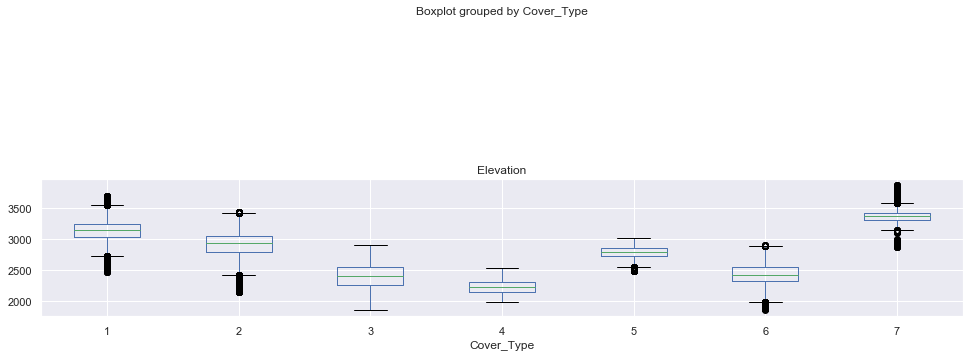

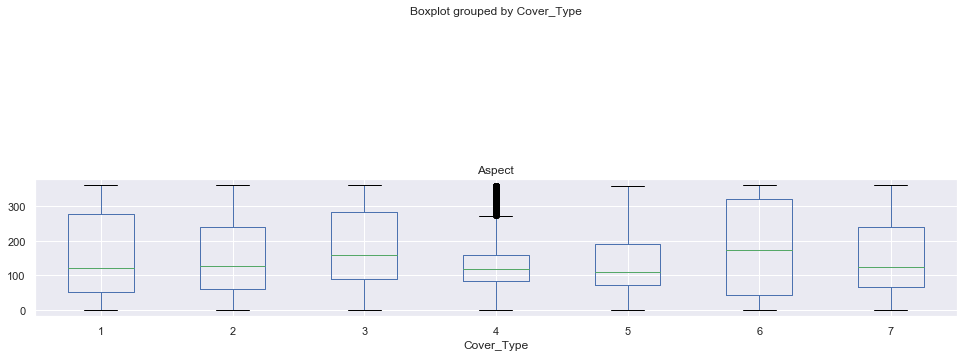

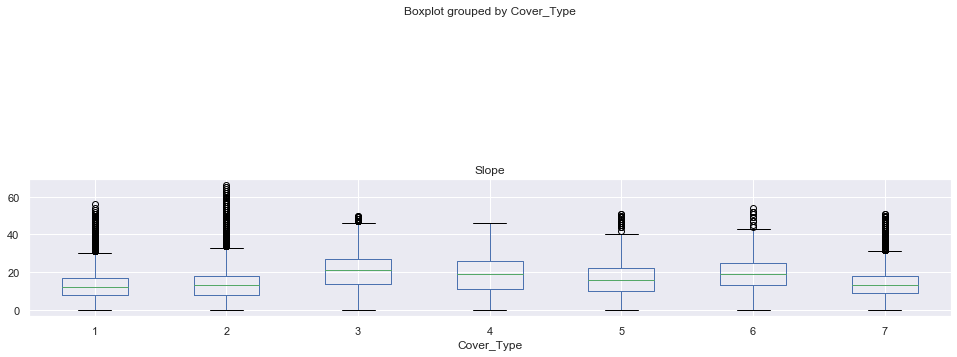

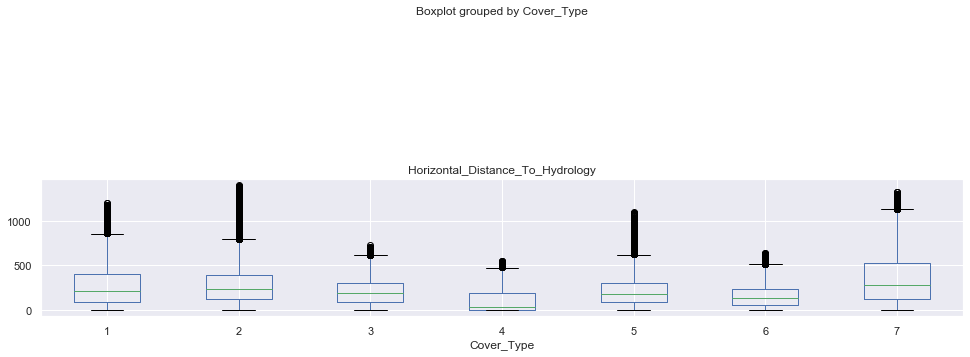

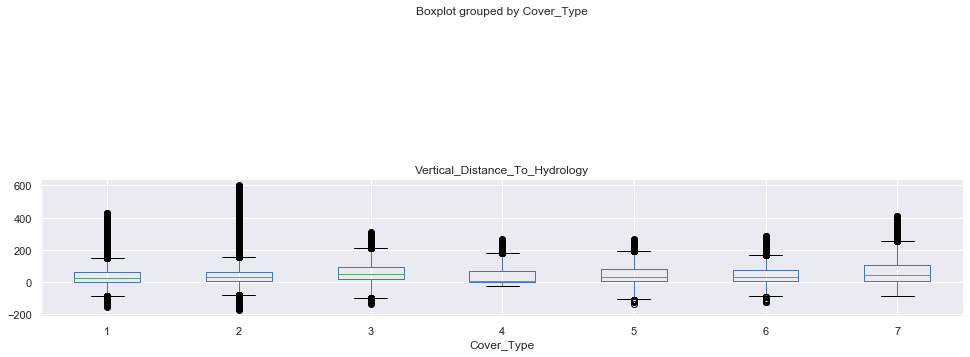

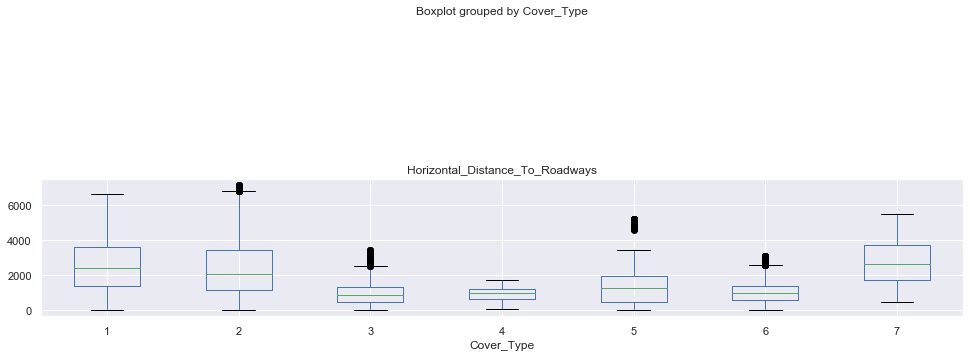

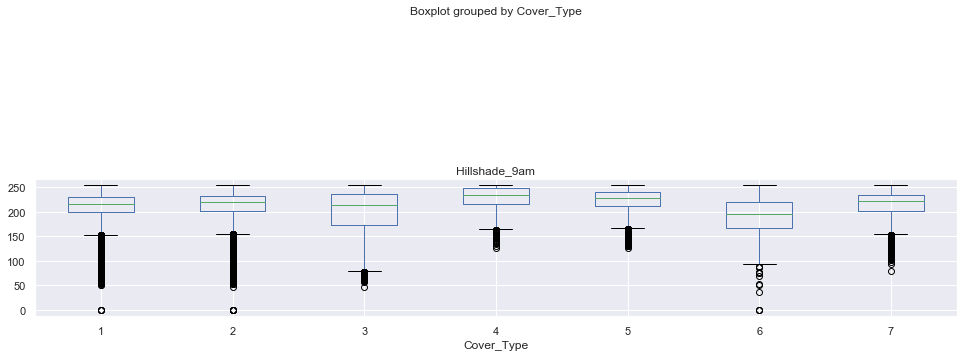

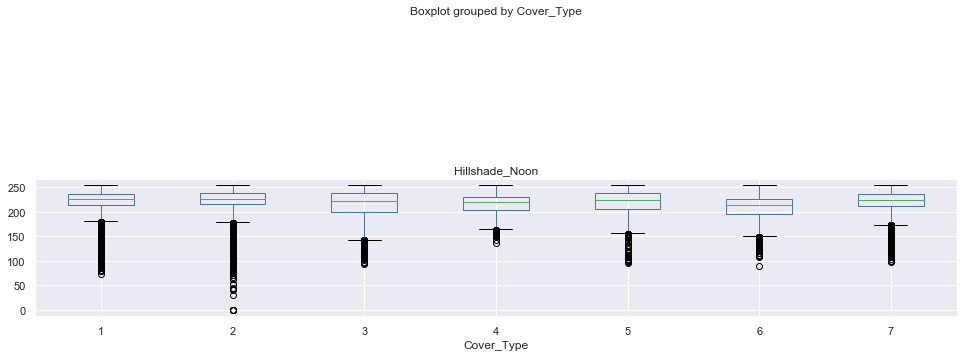

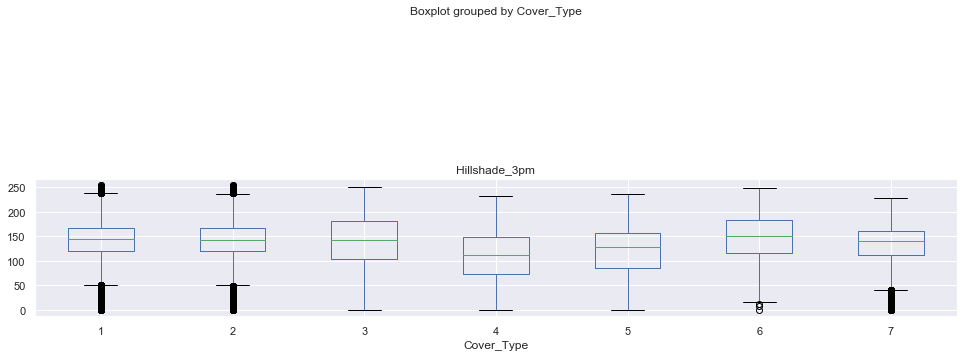

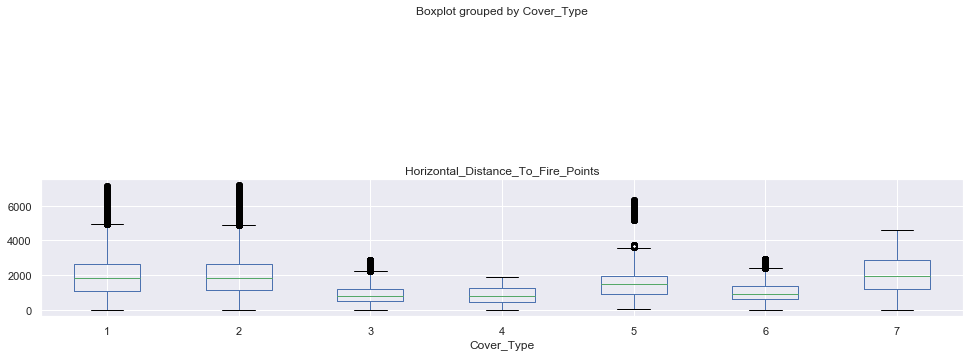

In [6]:
#Boxplot - Distribuição das variáveis quantitativas agrupadas pelo Cover Type
feat_list = list(df.columns[0:10])
for feat in feat_list:
    df.boxplot(column=feat, by='Cover_Type', figsize=(16,30), layout=(10,1))

A análise dos boxplot mostra que a Feature Elevation apresenta distribuições separáveis para as Cover Types. Dessa forma passa a ser uma feature importante para a classificação.

Sobre as distribuições das features quantitativas: 
* Horizontal Distance to road e Horizontal Distance to Hydrology apresentam distribuições semelhantes;
* Hillshade 9am e Noon apresenam skew para esquerda (negativo);
* Aspect e Hillshade 3pm apresentam distribuições normais;
* Vertical Distance to Hydrology apresenta muitos valores nulos


#### 2.3.2) Variáveis Qualitativas

Agrupar as one-hot encoded features e exibir Mosaic Plot

In [7]:
# Agrupando as one-hot enconded features 
df['Wilderness_Area'] = df.iloc[:,10:14].idxmax(1)
df['Soil_Type'] = df.iloc[:,14:54].idxmax(1)
df.head(100)


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type,Wilderness_Area,Soil_Type
0,2596,51,3,258,0,510,221,232,148,6279,...,0,0,0,0,0,0,0,5,Wilderness_Area1,Soil_Type29
1,2590,56,2,212,-6,390,220,235,151,6225,...,0,0,0,0,0,0,0,5,Wilderness_Area1,Soil_Type29
2,2804,139,9,268,65,3180,234,238,135,6121,...,0,0,0,0,0,0,0,2,Wilderness_Area1,Soil_Type12
3,2785,155,18,242,118,3090,238,238,122,6211,...,0,0,0,0,0,0,0,2,Wilderness_Area1,Soil_Type30
4,2595,45,2,153,-1,391,220,234,150,6172,...,0,0,0,0,0,0,0,5,Wilderness_Area1,Soil_Type29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2860,31,10,295,98,3644,218,218,135,5904,...,0,0,0,0,0,0,0,1,Wilderness_Area1,Soil_Type12
96,3067,164,11,85,7,6811,230,243,144,2774,...,0,0,0,0,0,0,0,2,Wilderness_Area1,Soil_Type29
97,2804,72,5,543,61,3115,225,231,141,6471,...,0,0,0,0,0,0,0,2,Wilderness_Area1,Soil_Type12
98,2562,59,3,0,0,1116,221,233,148,5091,...,0,0,0,0,0,0,0,2,Wilderness_Area1,Soil_Type16


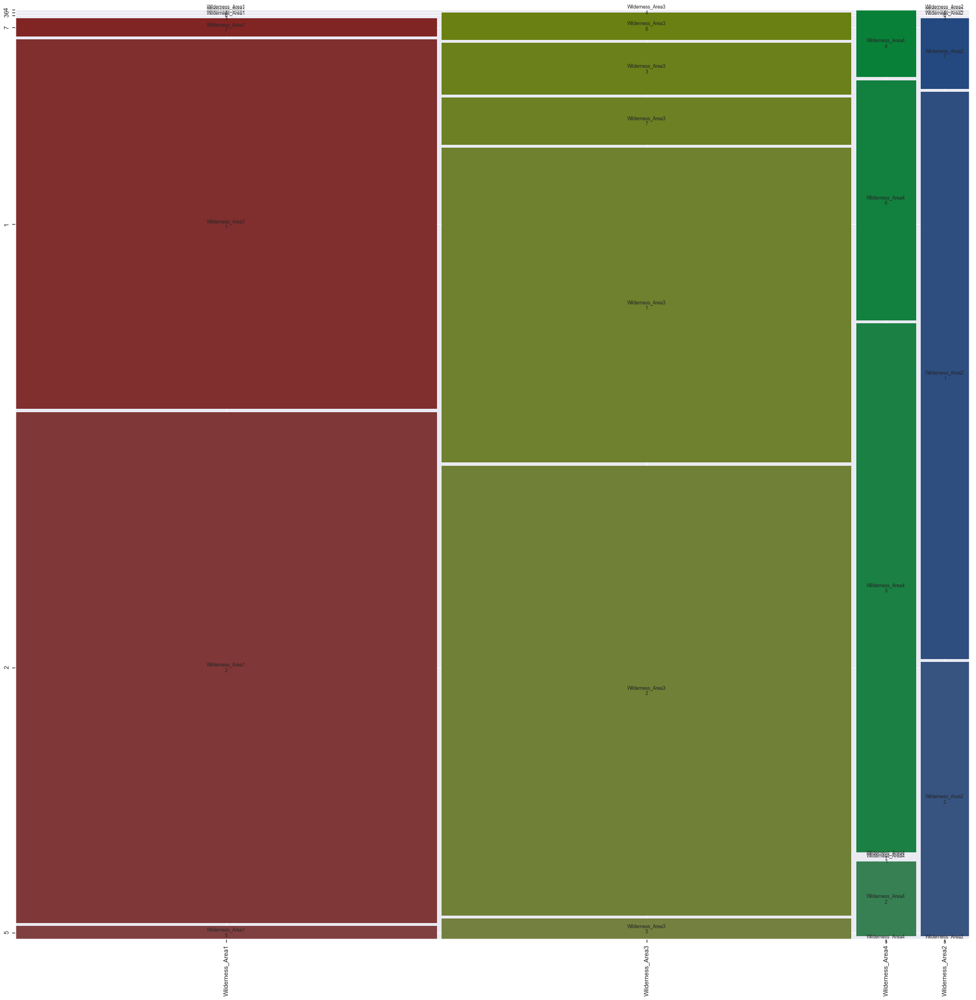

In [8]:
#Mosaic Plot
from statsmodels.graphics.mosaicplot import mosaic
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(30,30))
mosaic(df,['Wilderness_Area','Cover_Type'],ax=ax, label_rotation=90)
plt.show()

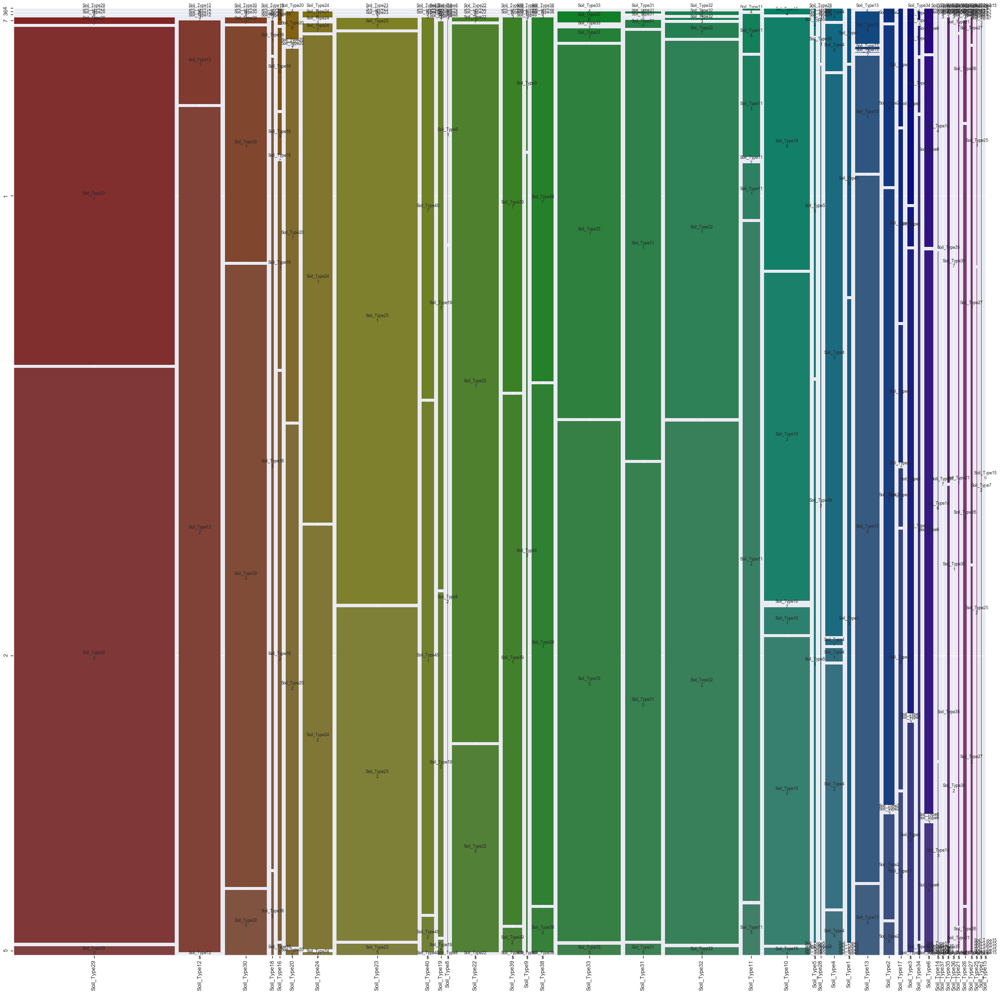

In [9]:
fig, ax = plt.subplots(figsize=(35,35))
mosaic(df,['Soil_Type','Cover_Type'],ax=ax, label_rotation=90)
plt.show()

In [10]:
#Número de amostras - Cover Type
df.groupby('Cover_Type').size()

Cover_Type
1    211840
2    283301
3     35754
4      2747
5      9493
6     17367
7     20510
dtype: int64

As cover types apresentam valores significativamente diferentes, dessa forma pode ser necessário rebalancear o dataset de treinamento.

#### 2.4) Limites dos dados

In [11]:
#Checagem se os valores estão dentro de um limite permitido ou razoável para as variáveis quantitativas.
pd.set_option('display.max_columns', None)
df.iloc[:,0:10].describe().T

,count,mean,std,min,25%,50%,75%,max
Elevation,581012.0,2959.365301,279.984734,1859.0,2809.0,2996.0,3163.0,3858.0
Aspect,581012.0,155.656807,111.913721,0.0,58.0,127.0,260.0,360.0
Slope,581012.0,14.103704,7.488242,0.0,9.0,13.0,18.0,66.0
Horizontal_Distance_To_Hydrology,581012.0,269.428217,212.549356,0.0,108.0,218.0,384.0,1397.0
Vertical_Distance_To_Hydrology,581012.0,46.418855,58.295232,-173.0,7.0,30.0,69.0,601.0
Horizontal_Distance_To_Roadways,581012.0,2350.146611,1559.254870,0.0,1106.0,1997.0,3328.0,7117.0
Hillshade_9am,581012.0,212.146049,26.769889,0.0,198.0,218.0,231.0,254.0
Hillshade_Noon,581012.0,223.318716,19.768697,0.0,213.0,226.0,237.0,254.0
Hillshade_3pm,581012.0,142.528263,38.274529,0.0,119.0,143.0,168.0,254.0
Horizontal_Distance_To_Fire_Points,581012.0,1980.291226,1324.195210,0.0,1024.0,1710.0,2550.0,7173.0


Apenas a feature Vertical_Distance_To_Hydrology apresenta valores negativos. Isso poderá ser corrigido numa normalização/reescalamento dos dados.

### 3) **(80%)** Nos blocos seguintes implemente seus classificadores (serão implementados 2 métodos diferentes).

#### 3.1) Qual método escolhido?

*Indique o método escolhido*

Baseline p/ Random Forest

#### 3.2) **(10%)** Baseline - Implemente seu classificador da forma mais simples possível para esse ser seu baseline

In [12]:
# Implementação. Use mais blocos se achar que ficará mais organizado.
# target são os valores que queremos prever.
target = df['Cover_Type']

# Agora podemos retirar a coluna do DataFrame.
df1 = df.drop(['Cover_Type','Soil_Type','Wilderness_Area'],axis=1)
df1.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1',
       'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4',
       'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5',
       'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10',
       'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',
       'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18',
       'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22',
       'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26',
       'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30',
       'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34',
       'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38',
       'Soil_Type39', 'Soil_Type40

In [13]:
# importar train_test_split do sklearn para dividir dados de treino e teste
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(df1,
                                                    target, 
                                                    test_size=0.25, 
                                                    random_state=123,
                                                    stratify=target)


In [14]:
#Número de amostras - Cover Type
# df.groupby('Cover_Type').size()
y_train.describe()


count    435759.000000
mean          2.051464
std           1.396493
min           1.000000
25%           1.000000
50%           2.000000
75%           2.000000
max           7.000000
Name: Cover_Type, dtype: float64

In [15]:
y_test.describe()

count    145253.000000
mean          2.051489
std           1.396544
min           1.000000
25%           1.000000
50%           2.000000
75%           2.000000
max           7.000000
Name: Cover_Type, dtype: float64

Nota-se que tanto o conjunto de treino (y_train) quanto o de teste (y_test) apresentam mesmas características estatísticas. Isso foi obtido com o parâmetro stratify na função train_test_split, que faz com que a divisão do conjunto de dados em treino e teste ocorra de forma justa.

In [16]:
#Treinamento
from sklearn.ensemble import RandomForestClassifier
import time

clf = RandomForestClassifier()
t0 = time.time()
rf_model = clf.fit(X_train, y_train)
print ("RF training time:", round(time.time()-t0, 3), "s")

RF training time: 10.712 s


In [17]:
#Classificação
t1 = time.time()
y_pred_rf = rf_model.predict(X_test)
print ("RF predict time:", round(time.time()-t1, 3), "s")

RF predict time: 0.987 s


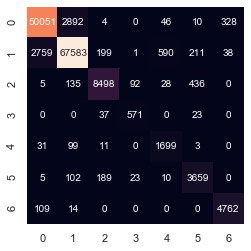

In [18]:
#Plot matriz de confusao
conf_matrix(y_test,y_pred_rf)

In [19]:
# Outras Métricas
from sklearn.metrics import classification_report
rf_clf_report = classification_report(y_test, y_pred_rf)
print('Classification Report - Random Forest-No preprocessing')
print(rf_clf_report)

Classification Report - Random Forest-No preprocessing
              precision    recall  f1-score   support

           1       0.94      0.95      0.94     52960
           2       0.95      0.95      0.95     70825
           3       0.92      0.95      0.94      8938
           4       0.90      0.83      0.87       687
           5       0.92      0.72      0.81      2373
           6       0.92      0.84      0.88      4342
           7       0.97      0.93      0.95      5128

    accuracy                           0.94    145253
   macro avg       0.93      0.88      0.90    145253
weighted avg       0.94      0.94      0.94    145253



#### 3.3) **(20%)** Versão 1 - O que podemos fazer para melhorar nosso baseline? Aplique técnicas como redução de dimensionalidade, normalização ou outras. Compare os resultados.

In [20]:
# Implementação. Use mais blocos se achar que ficará mais organizado.
from sklearn.preprocessing import MinMaxScaler

#Padronização (Standardization) MinMax(0,1)
scaler = MinMaxScaler(feature_range=(0,1))
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

#Treinamento
clf = RandomForestClassifier()
t0 = time.time()
rf_preproc_model = clf.fit(X_train_scaled, y_train)
print ("RF training time:", round(time.time()-t0, 3), "s")

RF training time: 10.113 s


In [21]:
#Classificação
t1 = time.time()
y_pred_rf_preproc = rf_preproc_model.predict(X_test_scaled)
print ("RF predict time:", round(time.time()-t1, 3), "s")

RF predict time: 0.656 s


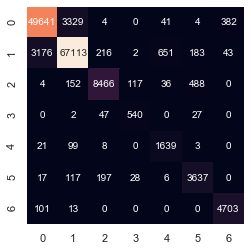

In [22]:
#Plot matriz de confusao
conf_matrix(y_test,y_pred_rf_preproc)

In [23]:
# Outras Métricas
from sklearn.metrics import classification_report
rf_clf_report_preproc = classification_report(y_test, y_pred_rf_preproc)
print('Classification Report - Random Forest-Preprocessing')
print(rf_clf_report_preproc)

Classification Report - Random Forest-Preprocessing
              precision    recall  f1-score   support

           1       0.93      0.94      0.93     52960
           2       0.94      0.95      0.94     70825
           3       0.91      0.95      0.93      8938
           4       0.88      0.79      0.83       687
           5       0.93      0.69      0.79      2373
           6       0.91      0.84      0.87      4342
           7       0.98      0.92      0.95      5128

    accuracy                           0.93    145253
   macro avg       0.92      0.87      0.89    145253
weighted avg       0.93      0.93      0.93    145253



#### 3.4) **(10%)** Tunning - Agora que temos um resultado promissor, vamos tentar melhorar o resultado alterando um ou mais hiper-parametro. Compare os resultados.

In [24]:
# PARAMETROS DO GRID SEARCH CV
grid_params = {
    "n_estimators": [10, 100, 1000],
    "max_depth": [5, 10, 20],
    "max_features": ["auto"],
    "bootstrap": [True],
    "random_state": [123]}

In [25]:
# Implementação. Use mais blocos se achar que ficará mais organizado.
from sklearn.model_selection import GridSearchCV
t = time.time()
rf_gridSearch_model = GridSearchCV(RandomForestClassifier(),
                      param_grid=grid_params, cv=3, verbose=10, scoring="accuracy")
print ("Grid Search RF model time:", round(time.time()-t, 3), "s")

Grid Search RF model time: 0.002 s


In [26]:
# APLICANDO O TREINO
t = time.time()
rf_gridSearch_model.fit(X_train, y_train)
print ("Grid Search RF training time:", round(time.time()-t, 3), "s")

Fitting 3 folds for each of 9 candidates, totalling 27 fits
[CV] bootstrap=True, max_depth=5, max_features=auto, n_estimators=10, random_state=123 
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[CV]  bootstrap=True, max_depth=5, max_features=auto, n_estimators=10, random_state=123, score=0.676, total=   2.7s
[CV] bootstrap=True, max_depth=5, max_features=auto, n_estimators=10, random_state=123 
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.7s remaining:    0.0s
[CV]  bootstrap=True, max_depth=5, max_features=auto, n_estimators=10, random_state=123, score=0.675, total=   2.2s
[CV] bootstrap=True, max_depth=5, max_features=auto, n_estimators=10, random_state=123 
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    5.0s remaining:    0.0s
[CV]  bootstrap=True, max_depth=5, max_features=auto, n_estimators=10, random_state=123, score=0.673, total=   1.8s
[CV] bootstrap=True, max_depth=5, max_features=auto, n_estimators=100, random_state=123

In [28]:
best_rf_model = rf_gridSearch_model.best_estimator_

In [29]:
# PREDIÇÃO TESTE
y_pred_rf_grid = best_rf_model.predict(X_test)

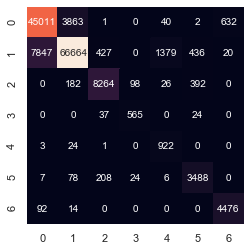

In [30]:
#Plot matriz de confusao
conf_matrix(y_test,y_pred_rf_grid)

In [31]:
from sklearn.metrics import classification_report
rf_grid_clf_report = classification_report(y_test, y_pred_rf_grid)
print(rf_grid_clf_report)

precision    recall  f1-score   support

           1       0.91      0.85      0.88     52960
           2       0.87      0.94      0.90     70825
           3       0.92      0.92      0.92      8938
           4       0.90      0.82      0.86       687
           5       0.97      0.39      0.55      2373
           6       0.92      0.80      0.86      4342
           7       0.98      0.87      0.92      5128

    accuracy                           0.89    145253
   macro avg       0.92      0.80      0.84    145253
weighted avg       0.89      0.89      0.89    145253



#### 3.5) Qual método escolhido?

Indique o método escolhido

Baseline p/ Decision Tree

#### 3.6) **(10%)** Baseline - Implemente seu classificador da forma mais simples possível para esse ser seu baseline

In [32]:
# Implementação. Use mais blocos se achar que ficará mais organizado.
from sklearn import tree
#Treinamento
clf = tree.DecisionTreeClassifier()
t2 = time.time()
dt_model = clf.fit(X_train, y_train)
print ("Decision Tree training time:", round(time.time()-t2, 3), "s")

Decision Tree training time: 6.478 s


In [33]:
#Classificação
t3 = time.time()
y_pred_tree = dt_model.predict(X_test)
print ("Decision Tree predict time:", round(time.time()-t3, 3), "s")

Decision Tree predict time: 0.241 s


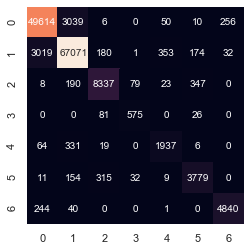

In [34]:
#Plot matriz de confusao
conf_matrix(y_test,y_pred_tree)

In [35]:
# Outras Métricas
from sklearn.metrics import classification_report
tree_clf_report = classification_report(y_test, y_pred_tree)
print('Classification Report - Decision Tree-No preprocessing')
print(tree_clf_report)

Classification Report - Decision Tree-No preprocessing
              precision    recall  f1-score   support

           1       0.94      0.94      0.94     52960
           2       0.95      0.95      0.95     70825
           3       0.93      0.93      0.93      8938
           4       0.84      0.84      0.84       687
           5       0.82      0.82      0.82      2373
           6       0.88      0.87      0.87      4342
           7       0.94      0.94      0.94      5128

    accuracy                           0.94    145253
   macro avg       0.90      0.90      0.90    145253
weighted avg       0.94      0.94      0.94    145253



#### 3.7) **(20%)** Versão 1 - O que podemos fazer para melhorar nosso baseline? Aplique técnicas como redução de dimensionalidade, normalização ou outras. Compare os resultados.

In [36]:
#Treinamento
clf = tree.DecisionTreeClassifier()
t2 = time.time()
dt_preproc_model = clf.fit(X_train_scaled, y_train)
print ("Decision Tree training time:", round(time.time()-t2, 3), "s")

Decision Tree training time: 6.733 s


In [37]:
#Classificação
t3 = time.time()
y_pred_tree_preproc = dt_preproc_model.predict(X_test_scaled)
print ("Decision Tree predict time:", round(time.time()-t3, 3), "s")

Decision Tree predict time: 0.164 s


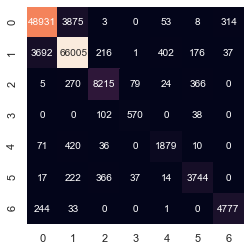

In [38]:
#Plot matriz de confusao
conf_matrix(y_test,y_pred_tree_preproc)

In [39]:
# Outras Métricas
from sklearn.metrics import classification_report
tree_clf_report_preproc = classification_report(y_test, y_pred_tree_preproc)
print('Classification Report - Decision Tree-Preprocessing')
print(tree_clf_report_preproc)

Classification Report - Decision Tree-Preprocessing
              precision    recall  f1-score   support

           1       0.92      0.92      0.92     52960
           2       0.94      0.93      0.93     70825
           3       0.92      0.92      0.92      8938
           4       0.80      0.83      0.82       687
           5       0.78      0.79      0.78      2373
           6       0.85      0.86      0.86      4342
           7       0.95      0.93      0.94      5128

    accuracy                           0.92    145253
   macro avg       0.88      0.88      0.88    145253
weighted avg       0.92      0.92      0.92    145253



#### 3.8) **(10%)** Tunning - Agora que temos um resultado promissor, vamos tentar melhorar o resultado alterando um ou mais hiper-parametro. Compare os resultados.

In [40]:
# Implementação. Use mais blocos se achar que ficará mais organizado.

# PARAMETROS DO GRID SEARCH CV
grid_params = {
    "criterion": ['gini','entropy'],
    "max_depth": [5, 10, 20],
    "max_features": ["auto"]}

In [41]:
# Implementação. Use mais blocos se achar que ficará mais organizado.
t = time.time()
dt_gridSearch_model = GridSearchCV(tree.DecisionTreeClassifier(), param_grid=grid_params, cv=3, verbose=10, scoring="accuracy")
print ("Grid Search Tree model time:", round(time.time()-t, 3), "s")

Grid Search Tree model time: 0.004 s


In [42]:
t = time.time()
dt_gridSearch_model.fit(X_train, y_train)
print ("Grid Search Tree training time:", round(time.time()-t, 3), "s")

Fitting 3 folds for each of 6 candidates, totalling 18 fits
[CV] criterion=gini, max_depth=5, max_features=auto ..................
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[CV]  criterion=gini, max_depth=5, max_features=auto, score=0.601, total=   0.7s
[CV] criterion=gini, max_depth=5, max_features=auto ..................
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.7s remaining:    0.0s
[CV]  criterion=gini, max_depth=5, max_features=auto, score=0.664, total=   0.6s
[CV] criterion=gini, max_depth=5, max_features=auto ..................
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    1.4s remaining:    0.0s
[CV]  criterion=gini, max_depth=5, max_features=auto, score=0.656, total=   0.4s
[CV] criterion=gini, max_depth=10, max_features=auto .................
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    1.8s remaining:    0.0s
[CV]  criterion=gini, max_depth=10, max_features=auto, score=0.566, total=   0.5s
[CV] crite

In [43]:
best_dt_model = dt_gridSearch_model.best_estimator_

In [44]:
# PREDIÇÃO TESTE
y_pred_tree_grid = best_dt_model.predict(X_test)

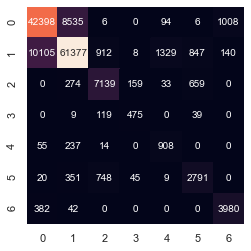

In [45]:
#Plot matriz de confusao
conf_matrix(y_test,y_pred_tree_grid)

In [46]:
from sklearn.metrics import classification_report
tree_grid_clf_report = classification_report(y_test, y_pred_tree_grid)
print(tree_grid_clf_report)

precision    recall  f1-score   support

           1       0.81      0.80      0.81     52960
           2       0.82      0.87      0.84     70825
           3       0.86      0.80      0.83      8938
           4       0.74      0.69      0.71       687
           5       0.75      0.38      0.51      2373
           6       0.70      0.64      0.67      4342
           7       0.90      0.78      0.84      5128

    accuracy                           0.82    145253
   macro avg       0.80      0.71      0.74    145253
weighted avg       0.82      0.82      0.82    145253



### 5) **(10%)** Conclusões

*Compare seus resultados. Imaginando que sua solução fosse para produção, qual deles você escolheria? Por que? Quais os riscos você enxerga? O que recomendaria de próximos passos para melhorar os resultados?*

In [47]:
print('Classification Report - Random Forest-No preprocessing')
print(rf_clf_report)
print('_______________________________________________________')
print('Classification Report - Random Forest-Preprocessing')
print(rf_clf_report_preproc)
print('_______________________________________________________')
print('Classification Report - Random Forest-Grid Search')
print(rf_grid_clf_report)
print('_______________________________________________________')
print('Classification Report - Decision Tree-No preprocessing')
print(tree_clf_report)
print('_______________________________________________________')
print('Classification Report - Decision Tree-Preprocessing')
print(tree_clf_report_preproc)
print('_______________________________________________________')
print('Classification Report - Decision Tree-Grid Search')
print(tree_grid_clf_report)

Classification Report - Random Forest-No preprocessing
              precision    recall  f1-score   support

           1       0.94      0.95      0.94     52960
           2       0.95      0.95      0.95     70825
           3       0.92      0.95      0.94      8938
           4       0.90      0.83      0.87       687
           5       0.92      0.72      0.81      2373
           6       0.92      0.84      0.88      4342
           7       0.97      0.93      0.95      5128

    accuracy                           0.94    145253
   macro avg       0.93      0.88      0.90    145253
weighted avg       0.94      0.94      0.94    145253

_______________________________________________________
Classification Report - Random Forest-Preprocessing
              precision    recall  f1-score   support

           1       0.93      0.94      0.93     52960
           2       0.94      0.95      0.94     70825
           3       0.91      0.95      0.93      8938
           4       0.88